# (PINN) -> 

# Multiple solutions polytropic -> Equation to be solved ...



# Used to make Figure 8 in Paper Astronomy and computing
## Environment set up

We train the PINN using PyTorch, using the following environment set up:
```bash

conda create -n pinn python=3
conda activate pinn
conda install jupyter numpy matplotlib
conda install pytorch torchvision torchaudio -c pytorch
```



In [6]:
from PIL import Image

import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

In [7]:
# ..........
def solut(x):
    # n =1 ... vraie solution pour n = 1 .....
    y= np.sin(x)/x    
    return y

def solutbis(xin):
    x = xin[:, 0]
    d = xin[:, 1] 
    y = np.sin(x)/x       # true solution for n = 1        
    return y

def solutder(x):  
    yd= np.cos(x)/x - np.sin(x)/x**2    
    return yd

class FCN(nn.Module):
    "Defines a connected network"
    
    def __init__(self, N_INPUT, N_OUTPUT, N_HIDDEN, N_LAYERS):
        super().__init__()
        activation = nn.Tanh
        self.fcs = nn.Sequential(*[
                        nn.Linear(N_INPUT, N_HIDDEN),
                        activation()])
        self.fch = nn.Sequential(*[
                        nn.Sequential(*[
                            nn.Linear(N_HIDDEN, N_HIDDEN),
                            activation()]) for _ in range(N_LAYERS-1)])
        self.fce = nn.Linear(N_HIDDEN, N_OUTPUT)
        
    def forward(self, x):
        x = self.fcs(x)
        x = self.fch(x)
        x = self.fce(x)
        return x

## Generate training data

> First, we generate some training data from a small part of the true solution.


torch.Size([4200, 2]) torch.Size([4200, 1])
torch.Size([6, 2]) torch.Size([6, 1])


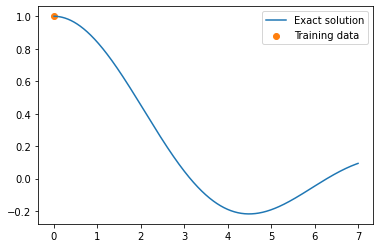

In [8]:
x = torch.linspace(0,7,700)
# d est l'indice polytropique ..... index polytropic 6 values are learned
d = torch.linspace(0,5,6)

X, D = torch.meshgrid(x, d)
xin = torch.stack((X.flatten(), D.flatten())).T

yin = solutbis(xin).view(-1,1)
print(xin.shape, yin.shape)


# ... slicing the true solution at x=0
x_data=x[0:20:20]
d_data = d

X_data ,D_data = torch.meshgrid(x_data, d_data)
xin_data = torch.stack((X_data.flatten(), D_data.flatten())).T
yin_data = solutbis(xin_data).view(-1,1)
yin_data[0]=1.
yin_data[1]=1.
yin_data[2]=1.
yin_data[3]=1.
yin_data[4]=1.
yin_data[5]=1.


print(xin_data.shape, yin_data.shape)

plt.figure()
d_value = 1
xin_slice = xin[:, 1] == d_value
plt.plot(xin[xin_slice, 0], yin[xin_slice, 0], label="Exact solution")
xin_data_slice = xin_data[:, 1] == d_value
plt.scatter(xin_data[xin_data_slice, 0], yin_data[xin_data_slice, 0], color="tab:orange", label="Training data")
plt.legend()
plt.show()





## Normal neural network

> Next, we train a standard neural network (fully connected network) to fit these training points.

>We find that the network is able to fit the solution very closely in the vicinity of the training points, but does not learn an accurate solution outside of them.

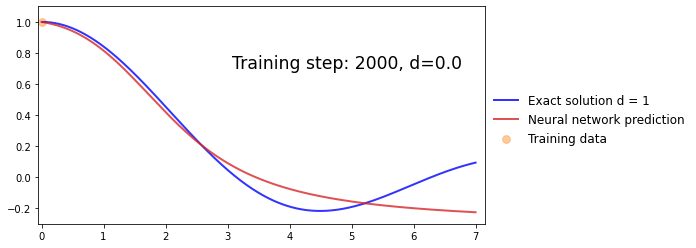

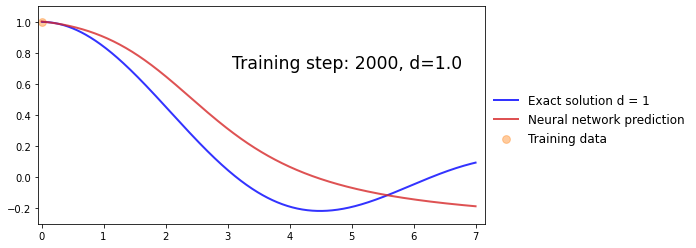

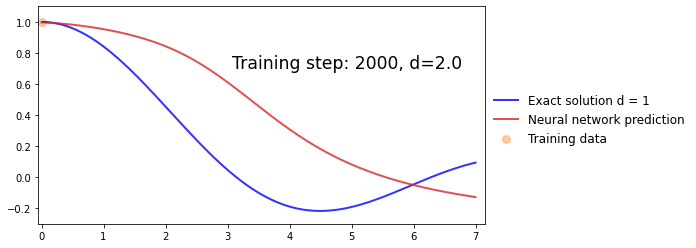

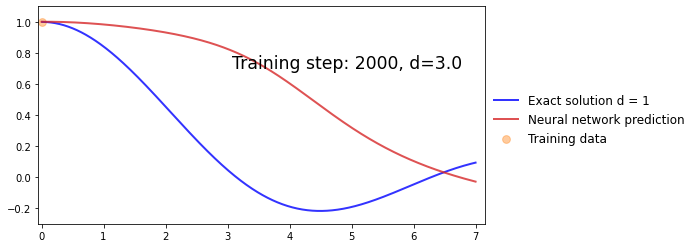

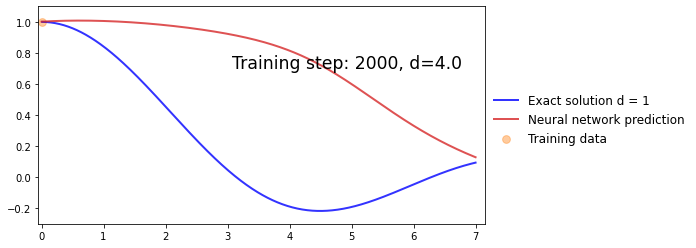

...

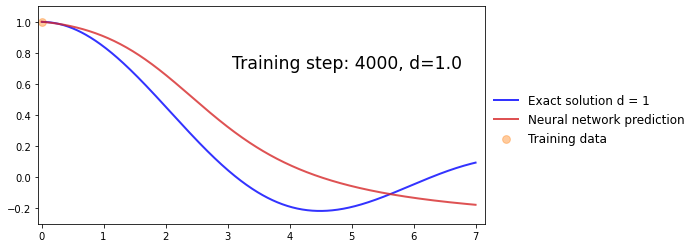

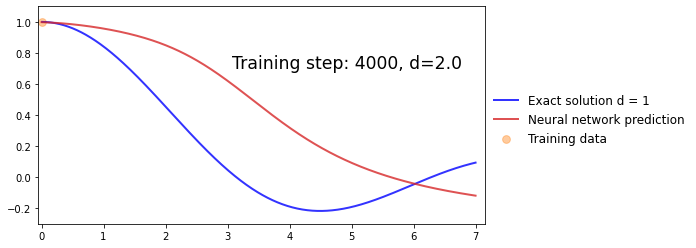

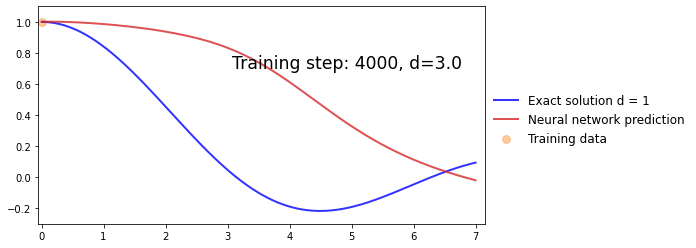

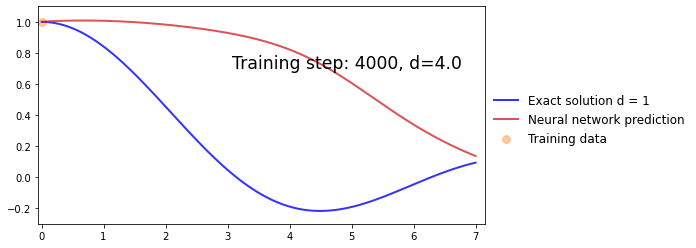

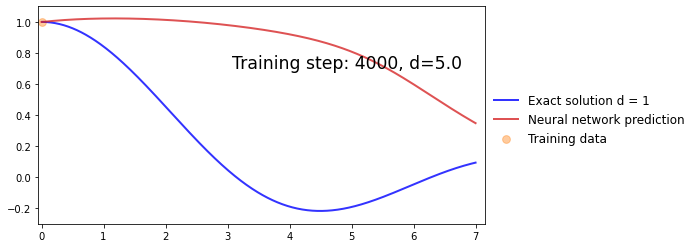

In [9]:
def plot_result(xin, yin, xin_data, yin_data, yh, d_value, xp=None):
    "Pretty plot training results"
    plt.figure(figsize=(8,4))

    xin_slice = xin[:, 1] == d_value
    plt.plot(xin[xin_slice, 0], yin[xin_slice, 0], color="blue", linewidth=2, alpha=0.8, label="Exact solution d = 1")
    plt.plot(xin[xin_slice, 0], yh[xin_slice, 0], color="tab:red", linewidth=2, alpha=0.8, label="Neural network prediction")

    xin_data_slice = xin_data[:, 1] == d_value
    plt.scatter(xin_data[xin_data_slice, 0], yin_data[xin_data_slice, 0], s=60, color="tab:orange",
                alpha=0.4, label='Training data')

    if xp is not None:
        xp_slice = xp[:, 1] == d_value
        plt.scatter(xp[xp_slice, 0], -0*torch.ones_like(xp[xp_slice,0]), s=30, color="tab:green", alpha=0.4, 
                    label='Physics loss training locations')
    l = plt.legend(loc=(1.01,0.34), frameon=False, fontsize="large")
    plt.setp(l.get_texts(), color="k")
    plt.xlim(-0.05, 7.15)
    plt.ylim(-0.3, 1.1)
    plt.text(3.065,0.7,f"Training step: {i+1}, d={d_value}",fontsize="xx-large",color="k")
    plt.axis("on")

# train standard neural network to fit training data
torch.manual_seed(123)
model = FCN(2, 1, 20, 4)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
files = []
for i in range(4000):
    optimizer.zero_grad()
    yh = model(xin_data)
    loss = torch.mean((yh - yin_data)**2)# use mean squared error
    loss.backward()
    optimizer.step()

    # plot the result as training progresses
    if (i+1) % 10 == 0: 
        yh = model(xin).detach()

        for d_value in d:
            plot_result(xin, yin, xin_data, yin_data, yh, d_value)

        file = "plots/nn_%.8i.png"%(i+1)
        #plt.savefig(file, bbox_inches='tight', pad_inches=0.1, dpi=100, facecolor="white")
        files.append(file)

        if (i+1) % 2000 == 0: plt.show()
        else: plt.close("all")

#save_gif_PIL("nn.gif", files, fps=20, loop=0)







## PINN

> Finally, we add the underlying differential equation ("physics loss") to the loss function. 

The physics loss aims to ensure that the learned solution is consistent with the underlying differential equation. This is done by penalising the residual of the differential equation over a set of locations sampled from the domain.

Here we evaluate the physics loss at ...

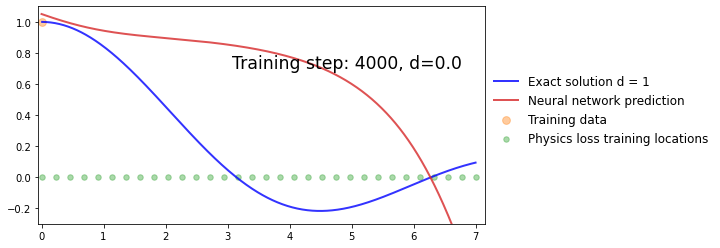

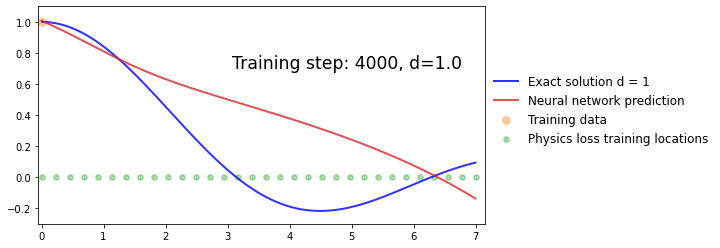

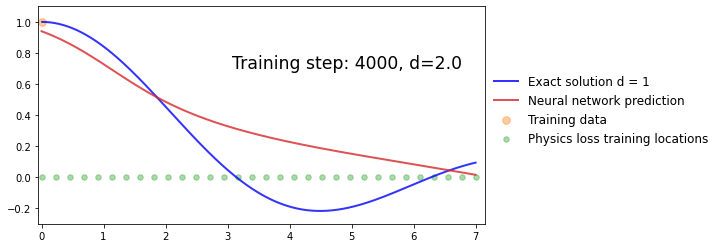

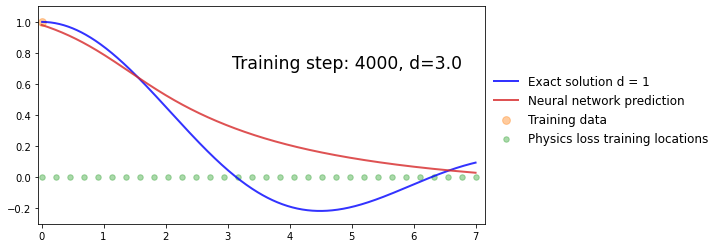

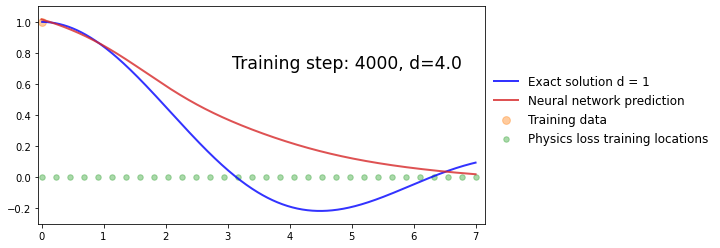

...

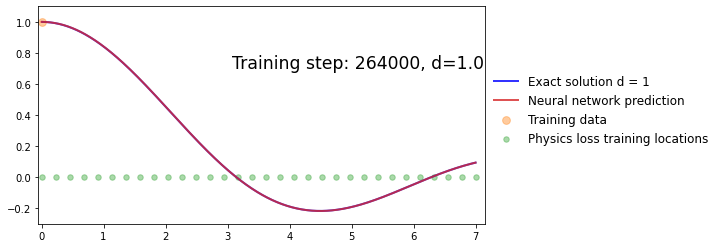

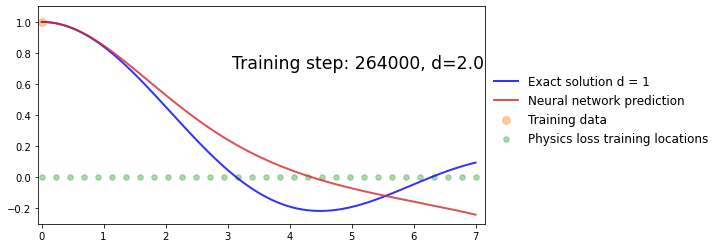

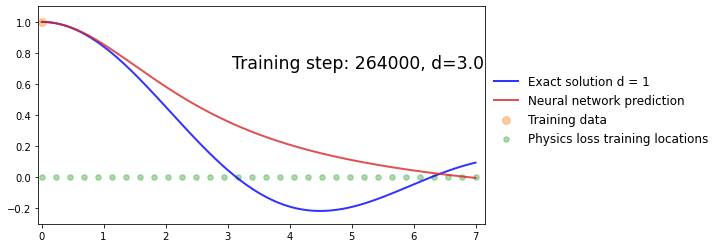

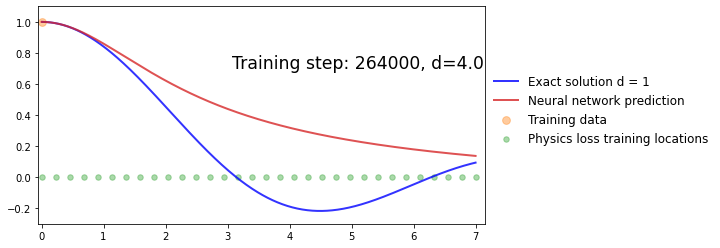

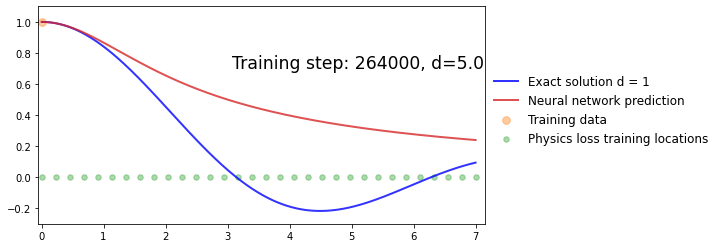

In [10]:
# Collocation points between 0 and 7 in x and between 0 and 5 for index ......
x_physics = torch.linspace(0,7,32)        
d_physics = torch.linspace(0,5,6)
X_physics, D_physics = torch.meshgrid(x_physics, d_physics)
xin_physics = (torch.stack((X_physics.flatten(), D_physics.flatten())).T).requires_grad_(True)

#ci dessous indic c'est l'indice appelé d .....
indic = xin_physics[:, 1].view(-1, 1)
xpp = xin_physics[:, 0].view(-1, 1)

torch.manual_seed(129)

model = FCN(2, 1, 20, 4)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
files = []

loss_history = []
loss2_history = []
loss1_history = []
mse_history =[]


for i in range(264000):
    
    optimizer.zero_grad()
    
    # We compute the "data loss" .............................................
    yh = model(xin_data)
    loss1 = 1.*torch.mean((yh-yin_data)**2)# use mean squared error
      
    # We compute the "physics loss" .............................................
    yhp = model(xin_physics)
    dx = torch.autograd.grad(yhp, xin_physics, torch.ones_like(yhp),retain_graph=True, create_graph=True)[0]  
    dy_x = dx[:, [0]]
    
    dxx = torch.autograd.grad(dy_x, xin_physics, torch.ones_like(dy_x),retain_graph=True, create_graph=True)[0] 
    dy_xx = dxx[:, [0]]
   
    loss1 = loss1 + 0.01*torch.mean(dy_x[[0],:]**2) +  0.01*torch.mean(dy_x[[1],:]**2) + 0.01*torch.mean(dy_x[[2],:]**2)
    loss1 = loss1 + 0.01*torch.mean(dy_x[[3],:]**2) + 0.01*torch.mean(dy_x[[4],:]**2) + 0.01*torch.mean(dy_x[[5],:]**2)    
    # ci-dessus on rajoute les conditions sur la dérivée (qui vaut zéro en x = 0) pour chaque indice ....
     
    # We compute the equation residual and associate physics loss ....    
    physics = xpp*dy_xx + 2*dy_x + xpp*yhp**indic        
    loss2 = (8.e-2)*(torch.mean(physics**2))
    
    # We backpropagate total loss ................................................
    loss = loss1 + loss2# add two loss terms together
    loss.backward()
    optimizer.step()
    
    
    # We plot the result as training progresses ....................................
    if (i+1) % 100 == 0:
        loss_history.append(loss.detach())
        loss2_history.append(loss2.detach())
        loss1_history.append(loss1.detach())        
        
        yh = model(xin).detach()
        xp = xin_physics.detach()    
        
        for d_value in d:
            plot_result(xin, yin, xin_data, yin_data, yh, d_value, xp)
                 
            
        if (i+1) % 4000 == 0: plt.show()
        else: plt.close("all")
            

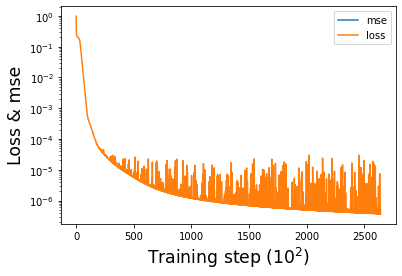

In [11]:
plt.plot(mse_history,label='mse')
plt.plot(loss_history,label='loss')
plt.xlabel('Training step ($10^2$)',fontsize="xx-large")
plt.ylabel('Loss & mse',fontsize="xx-large")
plt.yscale('log')
plt.legend()

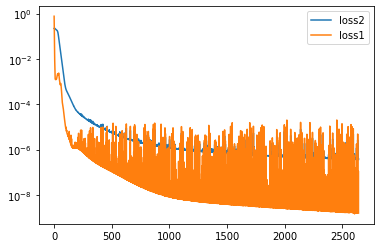

In [12]:
plt.plot(loss2_history, label="loss2")
plt.plot(loss1_history, label="loss1")
plt.yscale('log')
plt.legend()

tensor([0.0000, 0.5000, 1.0000, 1.5000, 2.0000, 2.5000, 3.0000, 3.5000, 4.0000,
        4.5000, 5.0000])


Text(0.5, 1.0, 'Polytropic solutions - predicted versus exact')

<Figure size 432x288 with 0 Axes>

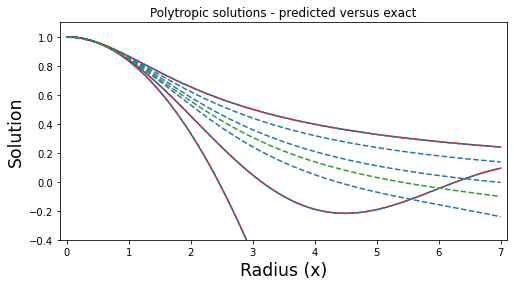

In [16]:
xx = torch.linspace(0, 7, 700)
dd = torch.linspace(0, 5, 11)

##dd = torch.linspace(1, 5, 5)
print(dd)

XX, DD = torch.meshgrid(xx, dd)
xinpr = torch.stack((XX.flatten(), DD.flatten())).T

yhppre = model(xinpr).detach()

##ythe = oscillator11(dd, w0, xx)
#y = 1. - 1./6*x*x  
#y = np.sin(x)/x
#ythe= 1./np.sqrt(1+x*x/3)        
# plot extrapolate    
fig5 = plt.figure(5)

#### check ..... n = 1 .... compare to true solution (red)
muv=1
xinpr_slice = xinpr[:, 1] == muv
ythe =  1. - 1./6*x*x 
ythe = np.sin(x)/x
#ythe = 1./np.sqrt(1+x*x/3)

plt.figure(figsize=(8,4))
plt.xlim(-0.1, 7.1)
plt.ylim(-0.4, 1.1)

plt.plot(xx, ythe, 'r')
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")

####### check .... n = 0 .....compare to true solution (red)
yhppre = model(xinpr).detach()
muv=0
xinpr_slice = xinpr[:, 1] == muv
ythe =  1. - 1./6*x*x 
plt.plot(xx, ythe, 'r')
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")

####### chech .... n = 5 .... compare to true solution (red)
yhppre = model(xinpr).detach()
muv=5
ythe= 1./np.sqrt(1+x*x/3)
xinpr_slice = xinpr[:, 1] == muv
plt.plot(xx, ythe, 'r')
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")
###print(yhppre[xinpr_slice, 0] )

#######  no true soluion ..... n = 2 (in blue) .....
yhppre = model(xinpr).detach()
muv=2
xinpr_slice = xinpr[:, 1] == muv
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")

####### no true solution  .... n = 3 (in blue)........
yhppre = model(xinpr).detach()
muv=3
xinpr_slice = xinpr[:, 1] == muv
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")

######## no true solution ..... n = 4 (in blue).......
yhppre = model(xinpr).detach()
muv=4
xinpr_slice = xinpr[:, 1] == muv
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:blue", label="prediction")



######## interpolate ..... n = 2.5 (in green)   ............
yhppre = model(xinpr).detach()
muv=2.5
xinpr_slice = xinpr[:, 1] == muv
plt.plot(xinpr[xinpr_slice, 0], yhppre[xinpr_slice, 0],'--', color="tab:green", label="prediction")
###print(yhppre[xinpr_slice, 0] )



plt.xlabel("Radius (x)",fontsize="xx-large")
plt.ylabel("Solution",fontsize="xx-large")
plt.title("Polytropic solutions - predicted versus exact")





tensor(nan)
